# EXPLORATORY DATA ANALYSIS
A notebook to explore the data.

# Set up

In [1]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 22.1 MB 23.3 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 76.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 86.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 29.2 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=344582 sha256=ba1d67cd74a71e29ee5e4bb9c6b1bc1c16e74f6a8aa9de0d2c30e026375479b8
  Stored in directory: /tmp/pip-ephem-wheel-cache-67q2zzma/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sh

In [2]:
# importing sys
import sys

# Auto reload: watch a directory for changed files and restarts a process when the change is detected
%load_ext autoreload
%autoreload 2

import random
import numpy as np
import pandas as pd
pd.options.display.max_columns = None
pd.options.mode.chained_assignment = None
pd.options.display.float_format

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from matplotlib.pyplot import figure
mpl.style.use("ggplot")
pylab.rcParams["figure.figsize"] = 8 , 6

import seaborn as sns
sns.set_style("white")

from pandas_profiling import ProfileReport

<ipython-input-2-d1b250ef794d>:26: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
%matplotlib inline

In [15]:
df=  pd.read_csv(r"zillow_preprocessed.csv")

In [5]:
df['bath']

0        1
1        2
2        3
3        4
4        4
        ..
13505    5
13506    2
13507    3
13508    2
13509    5
Name: bath, Length: 13510, dtype: int64

# Dataset overview

- Map of houses' locations

In [6]:
# Maps 
import plotly.express as px
import pandas as pd

color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df, 
                        lat="lat", 
                        lon="long", 
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [7]:
report = ProfileReport(df, title = "Report Zillow")
report.to_notebook_iframe()
report.to_file("Report_Zillow_processP1.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Process outliers

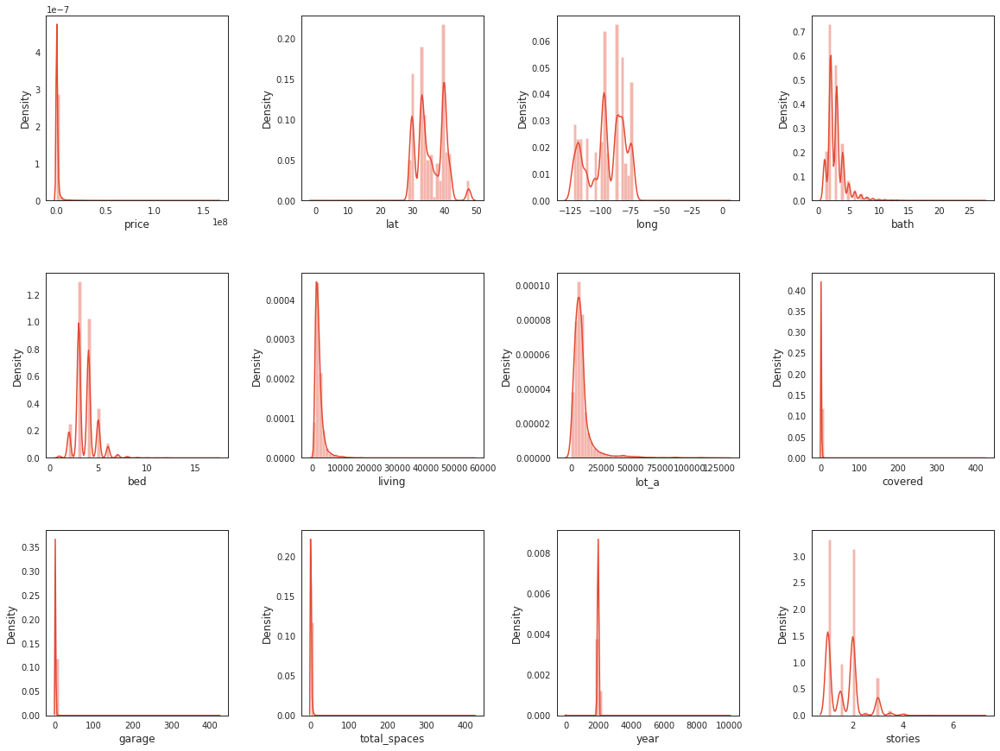

In [8]:
# Destiny
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, axs = plt.subplots(nrows = 3, ncols = 4, figsize=(16, 12))
index = 0
axs = axs.flatten()
for k,v in df.select_dtypes(include=["number"]).items():
    sns.distplot(v, ax=axs[index])
    index += 1
    if index == 13:
        break
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
plt.show();

**Note**: Most of distributions of features are skew. Since the data is statistically irregular (a lot of univariate outliers), we may need to remove outliers

In [9]:
df.select_dtypes(include=["number"]).columns

Index(['price', 'lat', 'long', 'bath', 'bed', 'living', 'lot_a', 'covered',
       'garage', 'total_spaces', 'year', 'stories'],
      dtype='object')

### price 

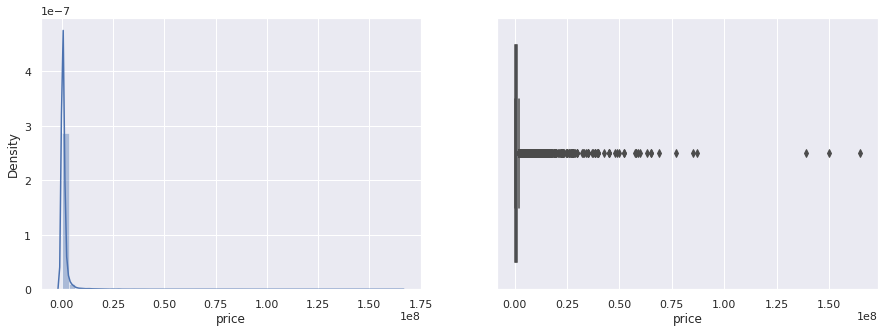

In [16]:
# Box Plot 

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Total Room Visualize 
import seaborn as sns
sns.set_theme()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["price"],  ax=axs[0]);
sns.boxplot(df["price"],  ax=axs[1]);

In [17]:
df["price"].describe()

count    1.351000e+04
mean     1.242987e+06
std      4.077022e+06
min      0.000000e+00
25%      3.099000e+05
50%      5.100000e+05
75%      9.800000e+05
max      1.650000e+08
Name: price, dtype: float64

In [12]:
from typing import Tuple
from sklearn.base import BaseEstimator, TransformerMixin

def find_boxplot_boundaries(df_col):
    Q1 = df_col.quantile(0.25)
    Q3 = df_col.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR   # ≥ 0 for this feature
    upper = Q3 + 1.5 * IQR
    return lower, upper

# OOP Inheritance
class BoxplotOutlierClipper(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.lower = None
        self.upper = None

    def fit(self, df_col):
        self.lower, self.upper = find_boxplot_boundaries(df_col)
        return self

    def transform(self, df_col):
        return df_col.clip(self.lower, self.upper)

In [18]:
find_boxplot_boundaries(df["price"])

(-695250.0, 1985150.0)

In [19]:
# Limit price 2.000.000
df = df[df['price'] <= 2000000]
  
# Print the shape of the dataframe
print(len(df))

12157


### bath & bed

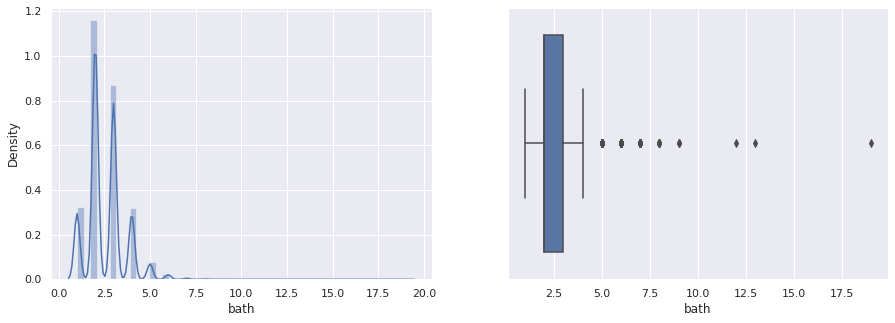

In [20]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["bath"],  ax=axs[0]);
sns.boxplot(df["bath"],  ax=axs[1]);

In [21]:
sns.distplot(df["bath"],  ax=axs[0]);

In [23]:
find_boxplot_boundaries(df["bath"])

(0.5, 4.5)

In [24]:
df = df[df['bath'] <= 5]
df = df[df['bath'] >= 0]

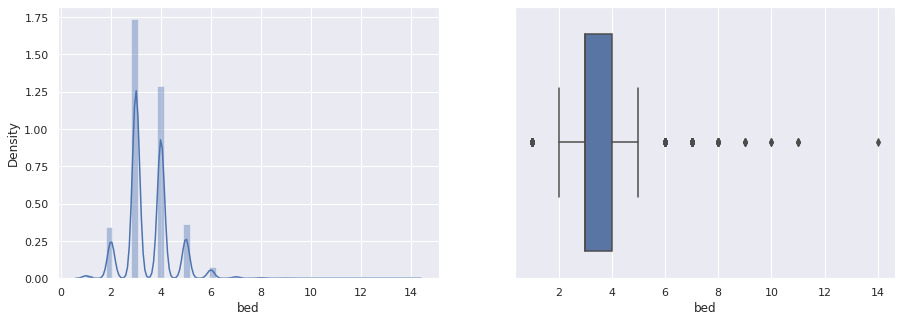

In [22]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["bed"],  ax=axs[0]);
sns.boxplot(df["bed"],  ax=axs[1]);

In [25]:
find_boxplot_boundaries(df["bed"])

(1.5, 5.5)

In [26]:
df = df[df['bed'] <= 6]
df = df[df['bath'] >= 1]
len(df)

11970

### living area

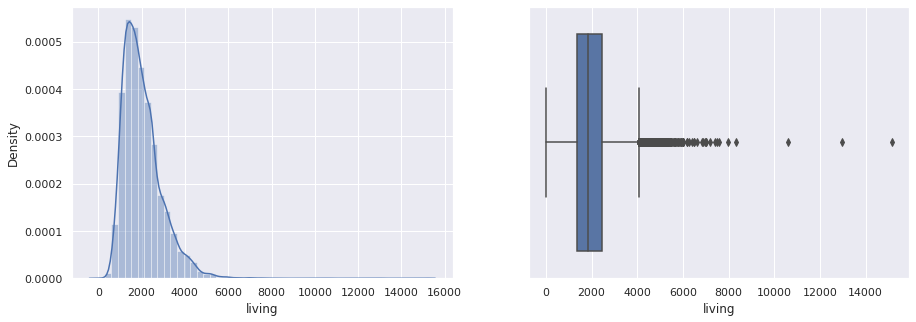

In [27]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["living"],  ax=axs[0]);
sns.boxplot(df["living"],  ax=axs[1]);

In [28]:
df = df[df['living'] <= 8000]
  
print(len(df))

11966


### covered

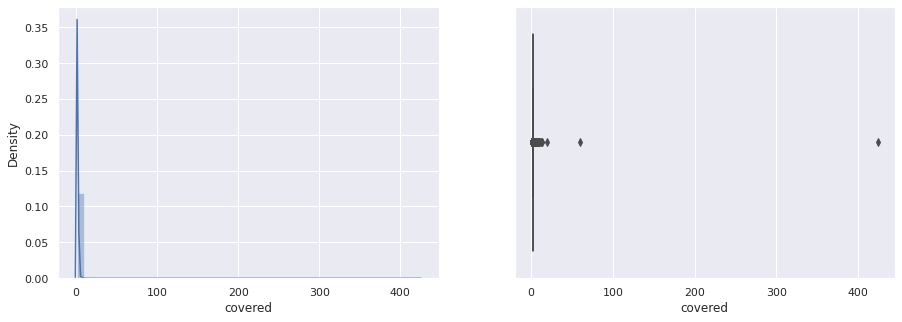

In [29]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["covered"],  ax=axs[0]);
sns.boxplot(df["covered"],  ax=axs[1]);

In [30]:
find_boxplot_boundaries(df["covered"])

(2.0, 2.0)

In [31]:
df = df[df['covered'] <= 5]
  
print(len(df))

11906


### garage

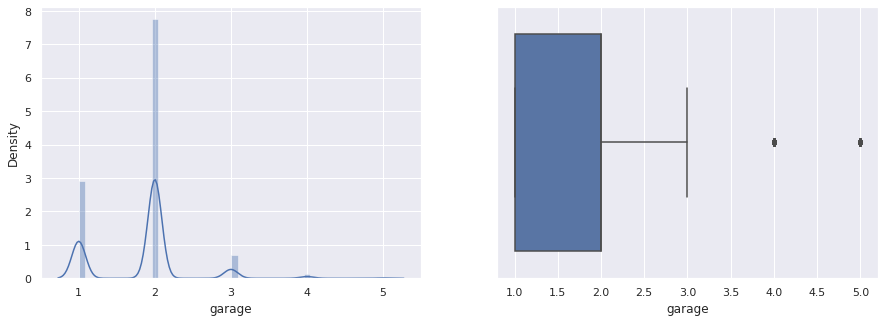

In [32]:

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["garage"],  ax=axs[0]);
sns.boxplot(df["garage"],  ax=axs[1]);

In [33]:
find_boxplot_boundaries(df["garage"])

(-0.5, 3.5)

In [34]:
df = df[df['garage'] <= 4]
  
print(len(df))

11880


### total spaces

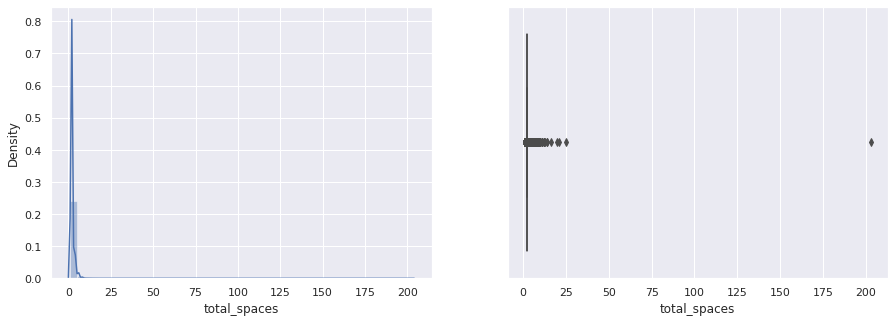

In [35]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["total_spaces"],  ax=axs[0]);
sns.boxplot(df["total_spaces"],  ax=axs[1]);

In [36]:
df = df[df['total_spaces'] <= 30]
  
print(len(df))

11879


### year

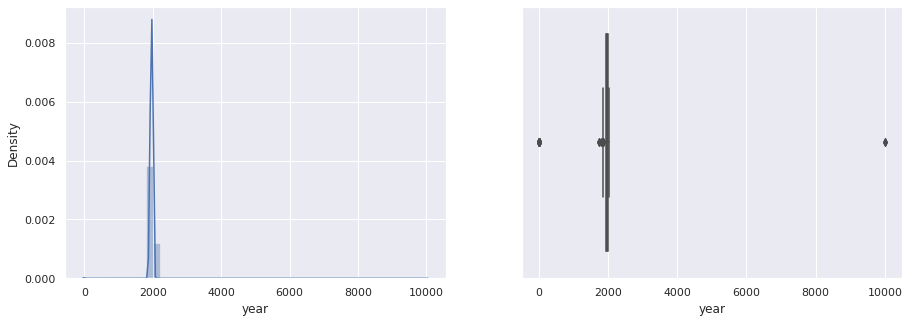

In [37]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["year"],  ax=axs[0]);
sns.boxplot(df["year"],  ax=axs[1]);

In [38]:
find_boxplot_boundaries(df["year"])

(1858.0, 2082.0)

In [39]:
df = df[df['year'] <= 2023]
df = df[df['year'] > 1850]
print(len(df))

11853


lot area

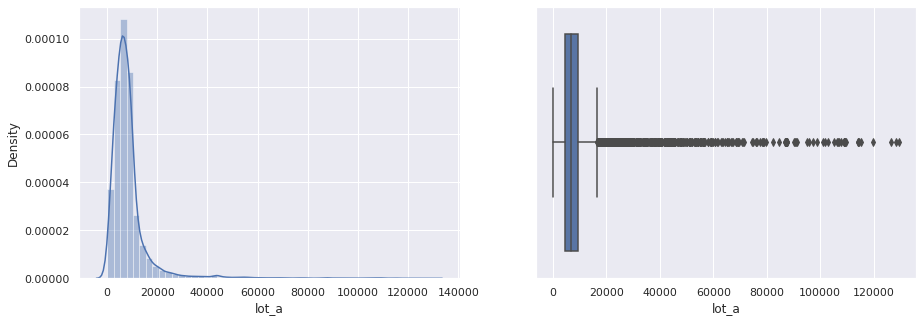

In [40]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["lot_a"],  ax=axs[0]);
sns.boxplot(df["lot_a"],  ax=axs[1]);

In [41]:
find_boxplot_boundaries(df["lot_a"])

(-2646.93898152963, 16608.36496921605)

In [42]:
df = df[df['lot_a'] < 17000]
print(len(df))

11050


### stories

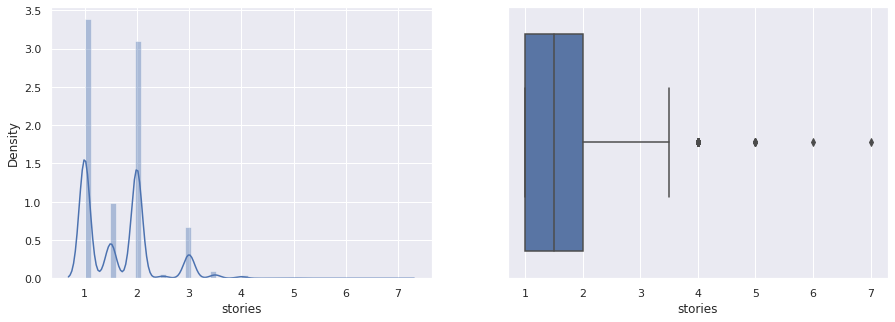

In [43]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df["stories"],  ax=axs[0]);
sns.boxplot(df["stories"],  ax=axs[1]);

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11050 entries, 0 to 13508
Data columns (total 28 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         11050 non-null  int64  
 1   status        11050 non-null  object 
 2   add_attr      11050 non-null  bool   
 3   city          11050 non-null  object 
 4   state         11050 non-null  object 
 5   lat           11050 non-null  float64
 6   long          11050 non-null  float64
 7   bath          11050 non-null  int64  
 8   bed           11050 non-null  int64  
 9   living        11050 non-null  int64  
 10  lot_a         11050 non-null  float64
 11  fireplace     11050 non-null  object 
 12  parking       11050 non-null  object 
 13  covered       11050 non-null  int64  
 14  garage        11050 non-null  int64  
 15  total_spaces  11050 non-null  int64  
 16  subtype       11050 non-null  object 
 17  year          11050 non-null  int64  
 18  sewer         11050 non-nu

- After removing univariate-outliers, we recieved 11050 records

# Categorical features analysis

## Subtype proportion

In [45]:
Count = df.groupby('status', as_index=False)['price'].count().sort_values('price')
Count.rename(columns = {'price':'count'}, inplace = True)
Count

,status,count
1,Auction,5
8,Re-activated,5
2,Coming soon,35
7,Price Change,41
3,Foreclosure,58
5,New,153
6,New construction,456
0,Active,1611
4,House for sale,8686


In [46]:
import plotly.graph_objects as go
plt.rcParams["figure.figsize"] = (5,5)
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=Count['status'], values=Count['count'], hole=.2)])
fig

## Analysis of relationship between target and categorical features

### Relationship between price and state

In [47]:
mean_price = df.groupby('state', as_index=False)['price'].mean().sort_values('price')
mean_price

,state,price
9,OH,2.815439e+05
6,IN,2.957263e+05
10,PA,3.391915e+05
4,FL,4.087951e+05
12,TX,4.546404e+05
5,IL,4.865594e+05
7,NC,5.049476e+05
0,AZ,5.646842e+05
11,TN,6.143565e+05
3,DC,7.337072e+05


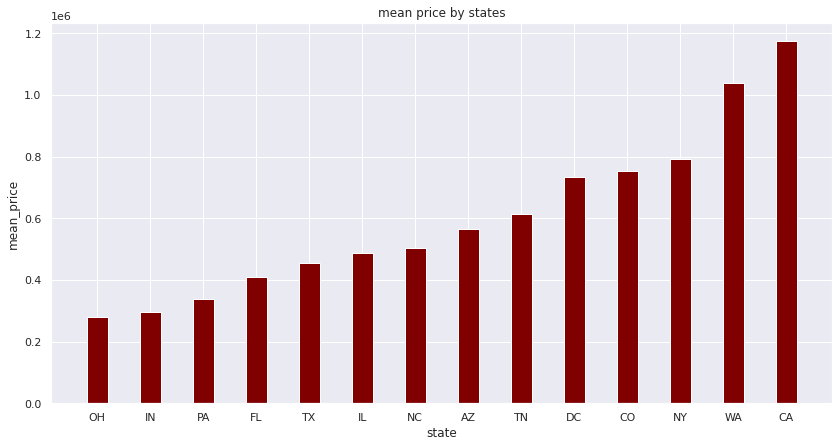

In [48]:
state = list(mean_price['state'])
price = list(mean_price['price'])
  
fig = plt.figure(figsize = (14, 7))
 
# creating the bar plot
plt.bar(state, price, color ='maroon',
        width = 0.4)
 
plt.xlabel("state")
plt.ylabel("mean_price")
plt.title("mean price by states")
plt.show()


### Relationship between price and status

In [49]:
mean_price = df.groupby('status', as_index=False)['price'].mean().sort_values('price')
mean_price

,status,price
1,Auction,411219.800000
8,Re-activated,413540.000000
7,Price Change,435073.146341
5,New,441322.725490
6,New construction,490697.833333
3,Foreclosure,523957.896552
4,House for sale,591942.891434
0,Active,603658.494103
2,Coming soon,606362.857143


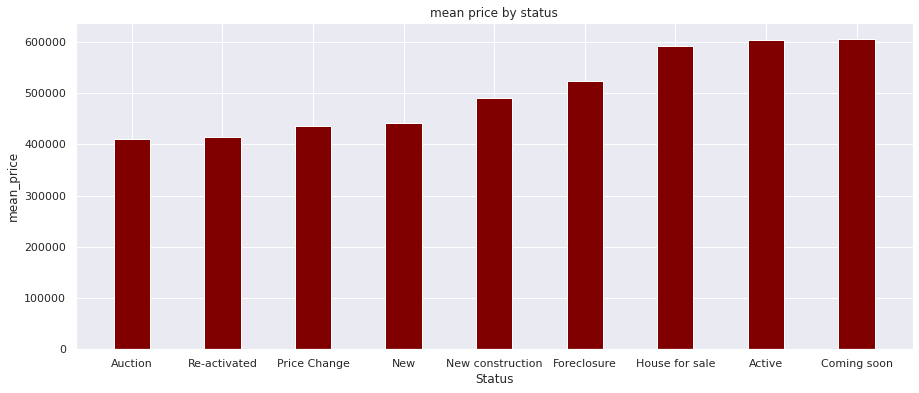

In [50]:
status = list(mean_price['status'])
price = list(mean_price['price'])
  
fig = plt.figure(figsize = (15, 6))
 
# creating the bar plot
plt.bar(status, price, color ='maroon',
        width = 0.4)
 
plt.xlabel("Status")
plt.ylabel("mean_price")
plt.title("mean price by status")
plt.show()

## Insight of some categorical features

We focus on some important features that people may care about

### Top 10 apps equipped for the houses

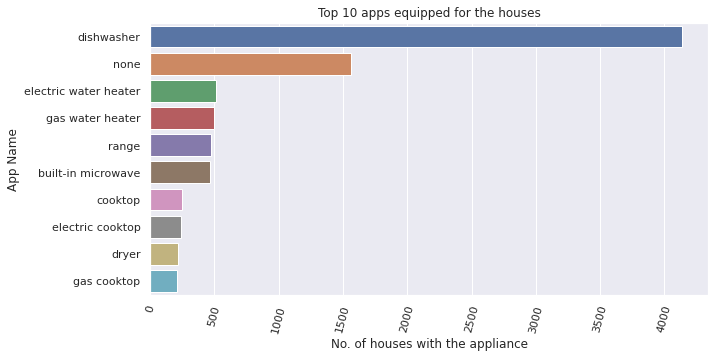

In [51]:
app_order = df['app'].value_counts().head(10).index
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='app', order=app_order)
plt.xticks(rotation=75)
plt.title('Top 10 apps equipped for the houses')
plt.xlabel('No. of houses with the appliance')
plt.ylabel('App Name');

### Top 10 materials used for the houses

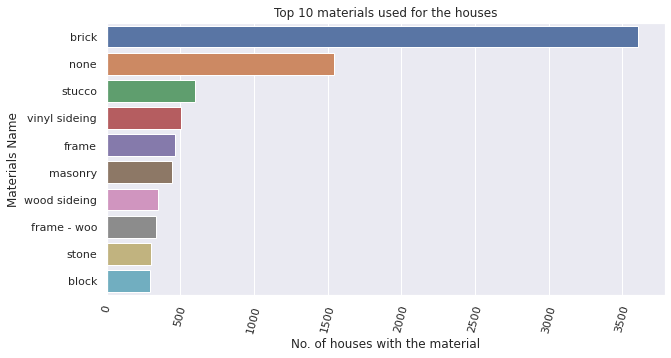

In [52]:
material_order = df['materials'].value_counts().head(10).index
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='materials', order=material_order)
plt.xticks(rotation=75)
plt.title('Top 10 materials used for the houses')
plt.xlabel('No. of houses with the material')
plt.ylabel('Materials Name');

### Top 10 roof types used for the houses

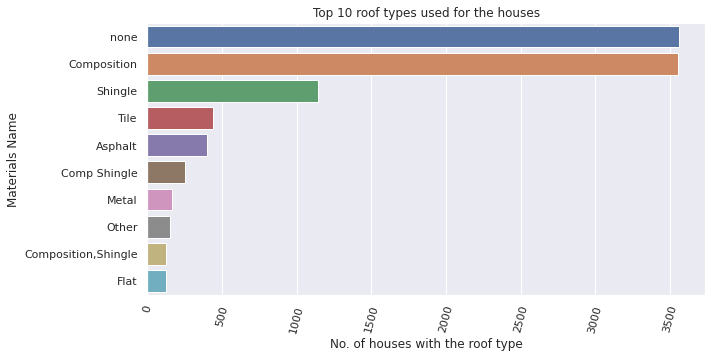

In [53]:
material_order = df['roof'].value_counts().head(10).index
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='roof', order=material_order)
plt.xticks(rotation=75)
plt.title('Top 10 roof types used for the houses')
plt.xlabel('No. of houses with the roof type')
plt.ylabel('Materials Name');

### Top 10 sewing services used for the houses

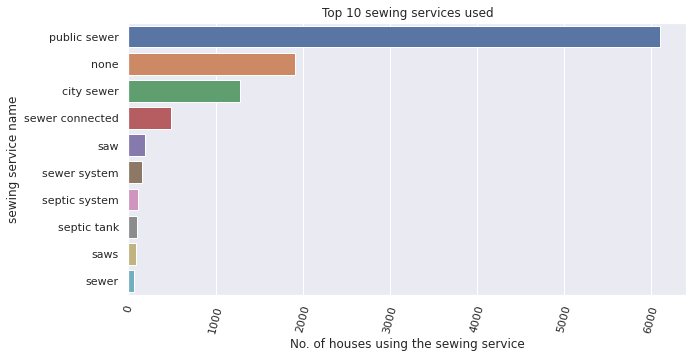

In [54]:
material_order = df['sewer'].value_counts().head(10).index
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='sewer', order=material_order)
plt.xticks(rotation=75)
plt.title('Top 10 sewing services used')
plt.xlabel('No. of houses using the sewing service')
plt.ylabel('sewing service name');

### Top 10 water services used for the houses

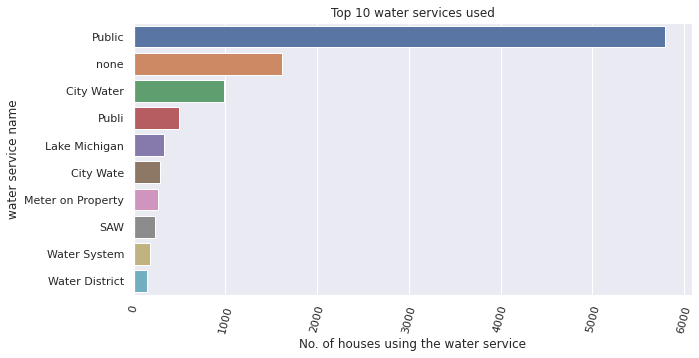

In [55]:
material_order = df['water'].value_counts().head(10).index
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='water', order=material_order)
plt.xticks(rotation=75)
plt.title('Top 10 water services used')
plt.xlabel('No. of houses using the water service')
plt.ylabel('water service name');

# Numeric features analysis

In [56]:
num_cols = ['price', 'lat', 'long', 'bath', 'bed', 'living', 'lot_a', 
            'covered', 'garage', 'total_spaces', 'year', 'stories']
dnum = df[num_cols]  

In [57]:
dnum.describe()

,price,lat,long,bath,bed,living,lot_a,covered,garage,total_spaces,year,stories
count,1.105000e+04,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000,11050.000000
mean,5.863316e+05,35.832373,-94.340782,2.480633,3.456652,1981.424706,6811.127480,1.932941,1.826968,2.215475,1966.497285,1.648462
std,4.160430e+05,4.504749,14.590993,0.926396,0.866495,838.635548,3360.022312,0.556461,0.577520,1.132300,35.184589,0.669176
min,0.000000e+00,0.000000,-122.508575,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,1860.000000,1.000000
25%,2.900000e+05,32.722548,-104.881840,2.000000,3.000000,1364.000000,4356.000000,2.000000,1.000000,2.000000,1941.000000,1.000000
50%,4.474500e+05,35.213256,-95.399310,2.000000,3.000000,1816.000000,6534.000000,2.000000,2.000000,2.000000,1965.000000,1.500000
75%,7.500000e+05,39.936876,-81.820813,3.000000,4.000000,2422.000000,9101.403889,2.000000,2.000000,2.000000,1998.000000,2.000000
max,2.000000e+06,47.733967,0.000000,5.000000,6.000000,7980.000000,16988.400000,5.000000,4.000000,25.000000,2023.000000,7.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ffa8e2dfaf0>,
      dtype=object)

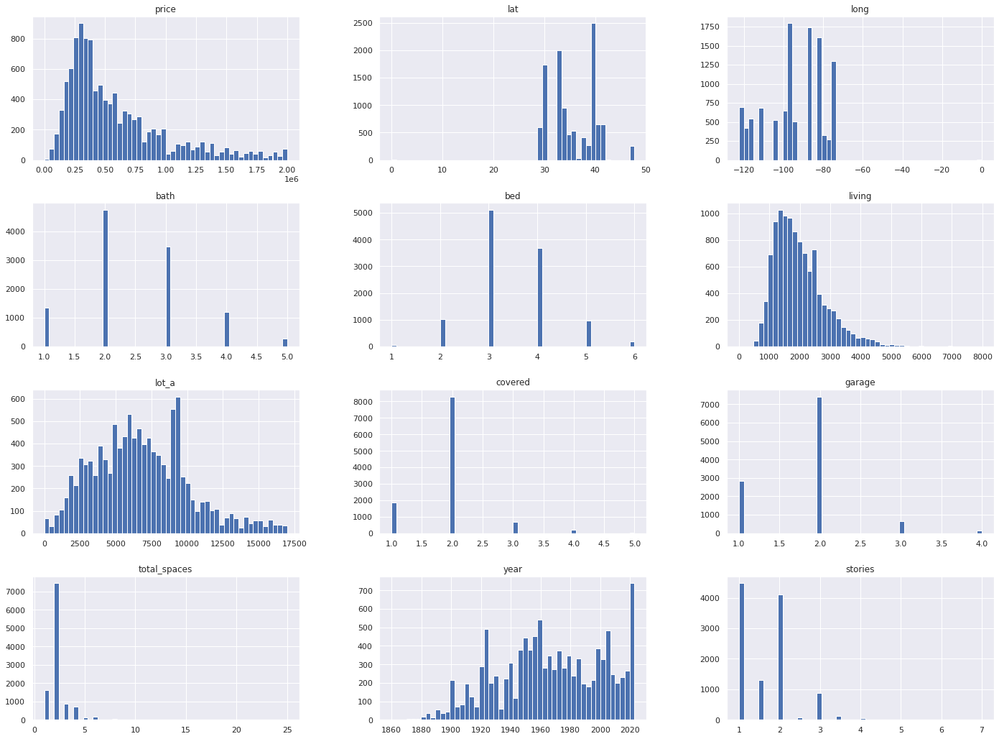

In [58]:
dnum.hist(bins=50, figsize=(24, 18))

## Relationship between price and discrete numeric columns

In [59]:
discrete_cols = ['bath','bed','covered', 'garage','total_spaces', 'stories']

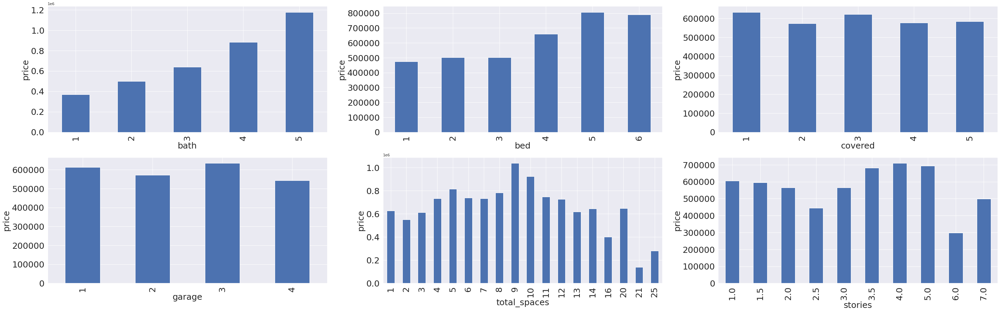

In [60]:
plt.figure(figsize=(20,40))
i = 1
for x in discrete_cols:
    plt.subplot(2, 3, i)
    dff = dnum.groupby(x)['price'].mean().dropna()
    dff.plot(kind='bar', figsize=(50,15), fontsize=25)
    plt.xlabel(x,fontsize=25)
    plt.ylabel("price",fontsize=25)
    i += 1

- It seems like houses with higher number of bathrooms having higher mean price

## Relationship between price and all numeric columns

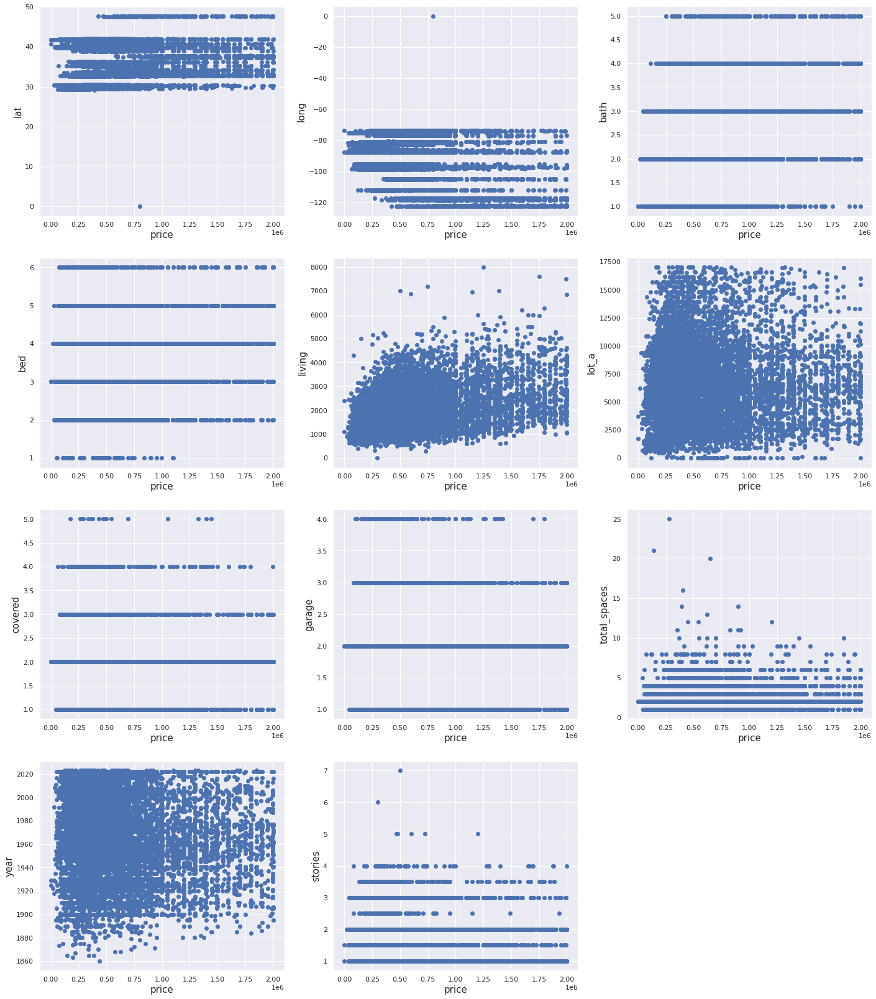

In [61]:
# Scatter plot between price and all numeric variables
plt.figure(figsize=(24,36))
i = 1
for column in dnum.drop(columns=["price"]).columns:
    plt.subplot(5, 3, i)
    plt.scatter(dnum["price"], dnum[column])
    plt.ylabel(column,fontsize=15)
    plt.xlabel("price",fontsize=15)
    i += 1

**Note:** No clear linear relationship between the target and some features.

## Correlation

**Suggestion:** Spearman’s correlation is preferrable to Pearson’s correlation in this case since:
- Numerical variables are visibly non-Gaussian.
- The link between two numerical variables is visibly non-linear.

Text(0.5, 1.0, 'Correlation matrix among numerical variables')

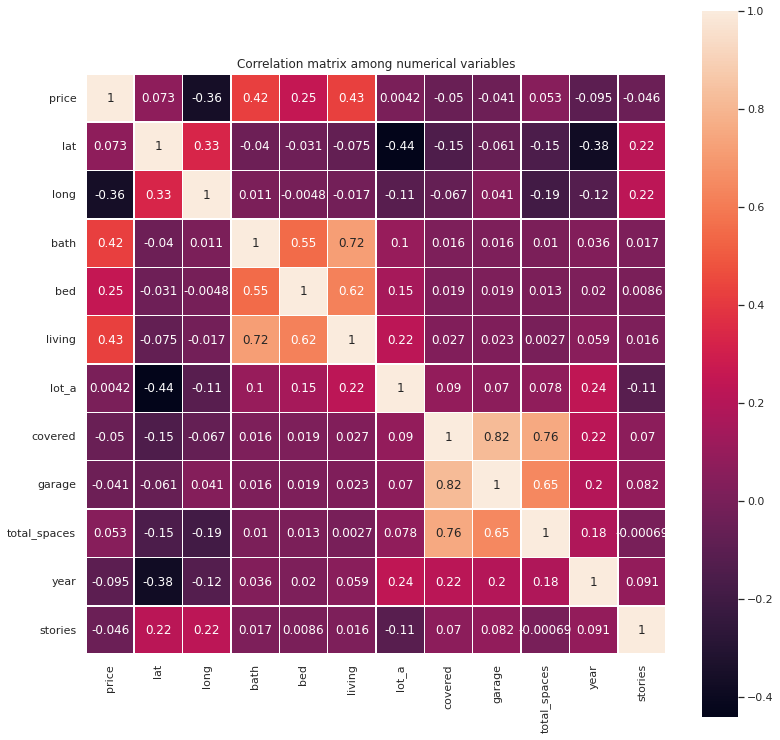

In [62]:
# Check for the monotonic relationships between variables using Spearman's corr
corr_mat = dnum.corr(method="spearman")

plt.figure(figsize=(13,13))
sns.heatmap(corr_mat, square=True, annot=True, linewidths=.5)
plt.title("Correlation matrix among numerical variables")

In [63]:
# Get diagonal and lower triangular pairs of correlation matrix
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

In [64]:
# Get the most correlated pairs of variables
tri_corr_mat = corr_mat.unstack()
cells_to_drop = get_redundant_pairs(dnum)
tri_corr_mat = tri_corr_mat.drop(labels=cells_to_drop).sort_values(ascending=False)

print("Top 10 positive correlated feature pairs:\n" + str(tri_corr_mat[0:10]))
print("\n----------------------------------------------------------------")
print("\nTop 10 negative correlated feature pairs:\n"+ str(tri_corr_mat[-10:]))
print("\n----------------------------------------------------------------")
print("\nTop 10 feature pairs:\n" + str(tri_corr_mat.abs().sort_values(ascending=False)[:10]))

Top 10 positive correlated feature pairs:
covered  garage          0.817365
         total_spaces    0.757090
bath     living          0.715143
garage   total_spaces    0.645140
bed      living          0.617331
bath     bed             0.553448
price    living          0.429013
         bath            0.423153
lat      long            0.334624
price    bed             0.253495
dtype: float64

----------------------------------------------------------------

Top 10 negative correlated feature pairs:
price  year           -0.095160
long   lot_a          -0.112158
lot_a  stories        -0.114285
long   year           -0.124323
lat    covered        -0.148230
       total_spaces   -0.152522
long   total_spaces   -0.188991
price  long           -0.359245
lat    year           -0.379812
       lot_a          -0.441864
dtype: float64

----------------------------------------------------------------

Top 10 feature pairs:
covered  garage          0.817365
         total_spaces    0.757090
ba

# Prepare data for next steps (preprocess task)

## Convert categorical feature to numeric

In [65]:
def cus_fireplace(df):
    for i in list(df.index):
        if df.at[i, 'fireplace'] in ["none", "1 fireplace"]:
            df.at[i, 'fireplace'] = int(1)
        elif df.at[i, 'fireplace'] == ["not applicable", "non"]:
            df.at[i, 'fireplace'] = int(0)
        elif df.at[i, 'fireplace'] in ["0.0",'1.0', '2.0', '3.0', '4.0', '5.0', '7.0', '6.0', '9.0', '8.0']:
            df.at[i, 'fireplace'] = int(float(df.at[i, 'fireplace']))
        elif df.at[i, 'fireplace'] in ["2 or more fireplaces", "2 or more fireplace"]:
            df.at[i, 'fireplace'] = int(2)
        elif df.at[i, 'fireplace'] in ["2+ fireplace", "three"] :
            df.at[i, 'fireplace'] = int(3)
        else:
            df.at[i, 'fireplace'] = int(1)
    return df

cus_fireplace(df).head()
df['fireplace'] = df['fireplace'].astype("int16")

In [66]:
def cus_parking(df):
    for i in list(df.index):
        if df.at[i, "parking"] in ['no garage', 'contact manager', 'garage: none know', 'see remarks',  'uncovered parking spaces 2', 'see remark', 'none']:
            df.at[i, "parking"] = int(0)
        else:
            df.at[i, "parking"] = int(1)
    return df
cus_parking(df)
df["parking"] = df["parking"].astype("int16")

In [67]:
def cus_sewer(df):
    for i in list(df.index):
        if df.at[i, "sewer"] in ["none", "other", "unknown", 'no septic approved', 'no sewer system','other/remark', 'septic needed',  'not connected (nearby', 'no septic syste']:
            df.at[i, "sewer"] = int(0)
        else:
            df.at[i, "sewer"] = int(1)
    return df
cus_sewer(df)
df["sewer"] = df["sewer"].astype("int16")

In [68]:
def cus_water(df):
    for i in list(df.index):
        if df.at[i, "water"] in ['None', 'Other', 'Othe', 'Not Connected (at lot', 'Co-op Water']:
            df.at[i, "water"] = int(0)
        else:
            df.at[i, "water"] = int(1)
    return df
cus_water(df)
df["water"] = df["water"].astype("int16")

In [69]:
def cus_heating(df):
    for i in list(df.index):
        if df.at[i, "heating"] in ['other', 'see remarks', 'other/remark', 'other-see remark']:
            df.at[i, "heating"] = int(0)
        else:
            df.at[i, "heating"] = int(1)
    return df
cus_heating(df)
df["heating"] = df["heating"].astype("int16")

In [70]:
def cus_cooling(df):
    for i in list(df.index):
        if df.at[i, "cooling"] in ['None', 'Other', 'Ductless', 'See Remark', 'Non', 'Ductless/Mini-Spli', 'Other/Remark', 'No Air Conditioning', 'Other-See Remarks']:
            df.at[i, "cooling"] = int(0)
        else:
            df.at[i, "cooling"] = int(1)
    return df
cus_cooling(df)
df["cooling"] = df["cooling"].astype("int16")

In [71]:
def cus_subtype(df):
    for i in list(df.index):
        if df.at[i, "subtype"] in ["none"]:
            df.at[i, "subtype"] = int(0)
        elif df.at[i, "subtype"] in ['Single Family - Detached', 'Single Family Residence', 'Single Family - Semi-Attached', 'Single Family - Attached', 'Single Family Residenc', 'Single Family Shared Wall', ]:
            df.at[i, "subtype"] = int(1)
        else:
            df.at[i, "subtype"] = int(2)
    return df
cus_subtype(df)
df["subtype"] = df["subtype"].astype("int16")

In [72]:
df.add_attr = df.add_attr.replace({True: 1, False: 0})

In [73]:
df["app"] = df.status.astype('category').cat.codes
df["materials"] = df.state.astype('category').cat.codes
df["roof"] = df.status.astype('category').cat.codes
df["foundation"] = df.status.astype('category').cat.codes
df["interior"] = df.state.astype('category').cat.codes
df["status"] = df.status.astype('category').cat.codes
df["state"] = df.status.astype('category').cat.codes
df.drop('city', axis =1,inplace = True)

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11050 entries, 0 to 13508
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         11050 non-null  int64  
 1   status        11050 non-null  int8   
 2   add_attr      11050 non-null  int64  
 3   state         11050 non-null  int8   
 4   lat           11050 non-null  float64
 5   long          11050 non-null  float64
 6   bath          11050 non-null  int64  
 7   bed           11050 non-null  int64  
 8   living        11050 non-null  int64  
 9   lot_a         11050 non-null  float64
 10  fireplace     11050 non-null  int16  
 11  parking       11050 non-null  int16  
 12  covered       11050 non-null  int64  
 13  garage        11050 non-null  int64  
 14  total_spaces  11050 non-null  int64  
 15  subtype       11050 non-null  int16  
 16  year          11050 non-null  int64  
 17  sewer         11050 non-null  int16  
 18  water         11050 non-nu

## Export data

In [75]:
df.to_csv("zillow_final.csv")